# Autotalker Tutorial

- **Creator**: Sebastian Birk (<sebastian.birk@helmholtz-munich.de>).
- **Affiliation:** Helmholtz Munich, Institute of Computational Biology (ICB), Talavera-López Lab
- **Date of Creation:** 07.12.2022
- **Date of Last Modification:** 14.12.2022

## 1. Setup

### 1.1 Import Libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")

In [3]:
import argparse
import os
import random
import warnings
from copy import deepcopy
from datetime import datetime

import anndata as ad
import matplotlib
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse as sp
import seaborn as sns
import squidpy as sq
import torch
from matplotlib.pyplot import rc_context

from autotalker.models import Autotalker
from autotalker.utils import (add_gps_from_gp_dict_to_adata,
                              extract_gp_dict_from_mebocost_es_interactions,
                              extract_gp_dict_from_nichenet_ligand_target_mx,
                              extract_gp_dict_from_omnipath_lr_interactions,
                              filter_and_combine_gp_dict_gps)

### 1.2 Define Parameters

In [4]:
## Dataset
dataset = "squidpy_seqfish_mouse_organogenesis"
#dataset = "squidpy_slideseqv2_mouse_hippocampus"
#dataset = "vizgen_merfish_mouse_brain"
#dataset = "vizgen_merfish_mouse_liver" 
#dataset = "vizgen_merfish_human_liver_cancer"
#dataset = "10x_xenium_human_breast_cancer"
#dataset = "starmap_plus_mouse_cns"
#dataset = "eel_fish_mouse_brain"
radius = 0.05102 # for spatial neighborhood graph (8 neighbors on average)

## Model
# AnnData Keys
counts_key = "counts"
cell_type_key = "celltype_mapped_refined"
adj_key = "spatial_connectivities"
spatial_key = "spatial"
gp_names_key = "autotalker_gp_names"
active_gp_names_key = "autotalker_active_gp_names"
gp_targets_mask_key = "autotalker_gp_targets"
gp_sources_mask_key = "autotalker_gp_sources"
latent_key = "autotalker_latent"

# Architecture
active_gp_thresh_ratio = 0

# Trainer
n_epochs = 10
n_epochs_all_gps = 2
lr = 0.01
lambda_l1_addon = 0.1

## Others
random_seed = 42

### 1.3 Run Notebook Setup

In [5]:
# Ignore future warnings and user warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [6]:
# Get time of notebook execution for timestamping saved artifacts
now = datetime.now()
current_timestamp = now.strftime("%d%m%Y_%H%M%S")

### 1.4 Configure Paths and Create Directories

In [7]:
# Define paths
figure_path = f"../figures/{dataset}/analysis/{current_timestamp}"
model_artifacts_path = f"../model_artifacts/{dataset}/analysis"
gp_data_folder_path = "../datasets/gp_data" # gene program data
srt_data_folder_path = "../datasets/srt_data" # spatially resolved transcriptomics data
srt_data_gold_folder_path = f"{srt_data_folder_path}/gold"
nichenet_ligand_target_mx_file_path = gp_data_folder_path + "nichenet_ligand_target_matrix.csv"
omnipath_lr_interactions_file_path = gp_data_folder_path + "omnipath_lr_interactions.csv"

# Create required directories
os.makedirs(figure_path, exist_ok=True)
os.makedirs(model_artifacts_path, exist_ok=True)

## 2. Data

### 2.1 Load Data & Compute Spatial Neighbor Graph

In [8]:
adata = ad.read_h5ad(f"{srt_data_gold_folder_path}/{dataset}.h5ad")

# Compute spatial neighborhood
sq.gr.spatial_neighbors(adata,
                        coord_type="generic",
                        spatial_key=spatial_key,
                        radius=radius)

### 2.2 Explore Data

Using dataset squidpy_seqfish_mouse_organogenesis.
Number of nodes (cells): 19416
Number of node features (genes): 351


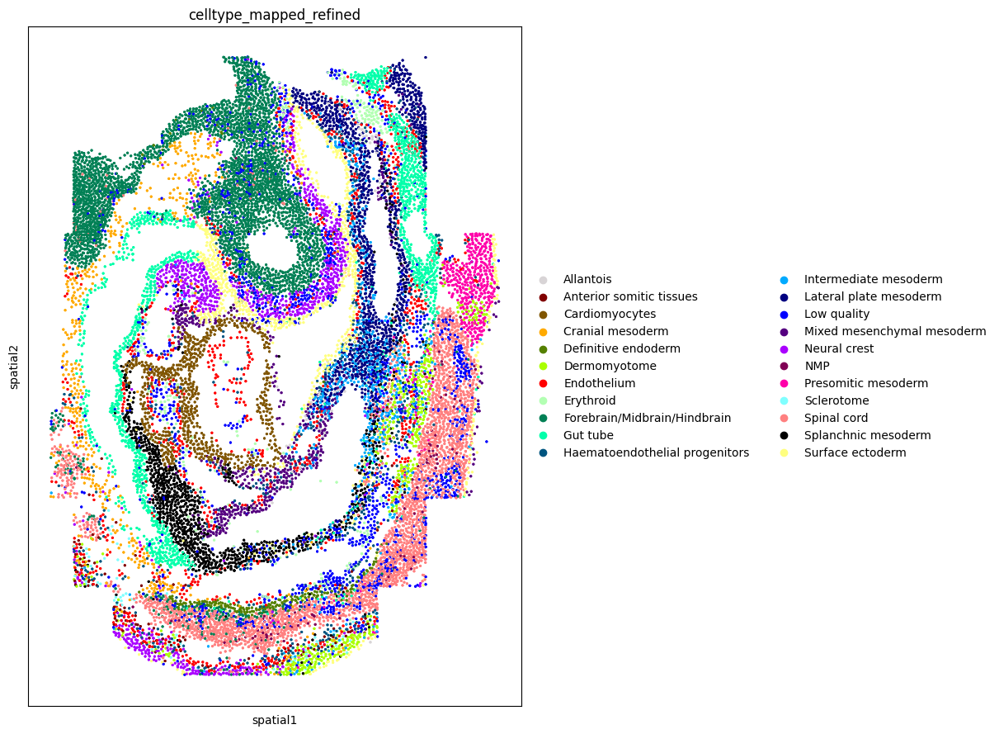

In [9]:
print(f"Using dataset {dataset}.")
print(f"Number of nodes (cells): {adata.layers['counts'].shape[0]}")
print(f"Number of node features (genes): {adata.layers['counts'].shape[1]}")

# Visualize cell-level annotated data in spatial space
sq.pl.spatial_scatter(adata, color=cell_type_key, shape=None, figsize=(12, 12))

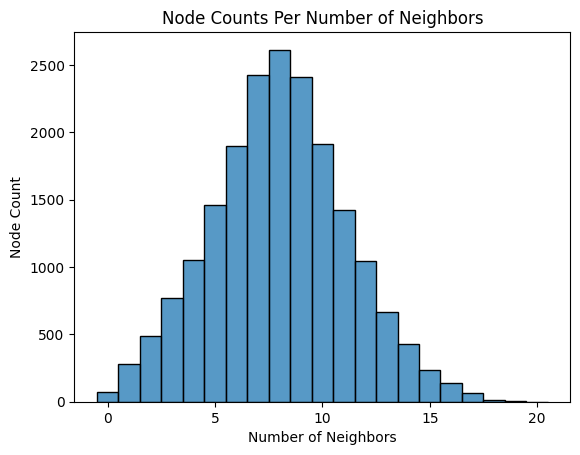

Average number of edges per node: 8.0.
Number of total edges: 77668.


In [10]:
# Plot histogram of node counts per number of neighbors
ax = sns.histplot(np.squeeze(np.asarray(adata.obsp['spatial_connectivities'].sum(axis=0))),
                  discrete=True)
ax.set_title("Node Counts Per Number of Neighbors")
ax.set_ylabel("Node Count")
ax.set_xlabel("Number of Neighbors")
fig = ax.figure
fig.savefig(f"{figure_path}/node_counts_per_n_neighs.png",
            bbox_inches="tight")
plt.show()

avg_edges_per_node = round(adata.obsp['spatial_connectivities'].sum(axis=0).mean(), 2)
print(f"Average number of edges per node: {avg_edges_per_node}.")
n_edges = int(sp.triu(adata.obsp['spatial_connectivities'], k=1).sum())
print(f"Number of total edges: {n_edges}.")

## 3. Train Autotalker Model with Prior Knowledge Cell-Cell-Interaction (CCI) Gene Programs (GPs)

### 3.1 Create Prior Knowledge CCI GP Mask

In [11]:
nichenet_gp_dict = extract_gp_dict_from_nichenet_ligand_target_mx(
    keep_target_ratio=0.01,
    load_from_disk=True,
    save_to_disk=True,
    file_path=nichenet_ligand_target_mx_file_path)

In [12]:
omnipath_gp_dict = extract_gp_dict_from_omnipath_lr_interactions(
    min_curation_effort=0,
    load_from_disk=True,
    save_to_disk=True,
    file_path=omnipath_lr_interactions_file_path)

In [13]:
mebocost_gp_dict = extract_gp_dict_from_mebocost_es_interactions(
    dir_path=f"{gp_data_folder_path}/metabolite_enzyme_sensor_gps/",
    species="mouse",
    genes_uppercase=True)

In [14]:
# Combine gene programs into one dictionary
combined_gp_dict = dict(nichenet_gp_dict)
combined_gp_dict.update(omnipath_gp_dict)
combined_gp_dict.update(mebocost_gp_dict)

In [15]:
# Filter and combine gene programs
combined_new_gp_dict = filter_and_combine_gp_dict_gps(
    gp_dict=combined_gp_dict,
    gp_filter_mode=None, #"subset", #None,
    combine_overlap_gps=False, #True,
    overlap_thresh_source_genes=0.9,
    overlap_thresh_target_genes=0.9,
    overlap_thresh_genes=0.9,
    verbose=True)

print(f"Number of gene programs before filtering and combining: {len(combined_gp_dict)}.")
print(f"Number of gene programs after filtering and combining: {len(combined_new_gp_dict)}.")

Number of gene programs before filtering and combining: 1725.
Number of gene programs after filtering and combining: 1725.


In [16]:
# Add the gene program dictionary as binary masks to the adata for model training
add_gps_from_gp_dict_to_adata(
    gp_dict=combined_new_gp_dict,
    adata=adata,
    genes_uppercase=True,
    gp_targets_mask_key=gp_targets_mask_key,
    gp_sources_mask_key=gp_sources_mask_key,
    gp_names_key=gp_names_key,
    min_genes_per_gp=1,
    min_source_genes_per_gp=0,
    min_target_genes_per_gp=0,
    max_genes_per_gp=None,
    max_source_genes_per_gp=None,
    max_target_genes_per_gp=None)

# Determine dimensionality of hidden encoder
n_hidden_encoder = len(adata.uns[gp_names_key])

In [17]:
# Summarize gene programs
print(f"Number of gene programs with probed genes: {len(adata.uns['autotalker_gp_names'])}.")
print(f"Example gene programs: {random.sample(list(adata.uns['autotalker_gp_names']), 5)}.")
print(f"Number of gene program target genes: {adata.varm['autotalker_gp_targets'].sum()}.")
print(f"Number of gene program source genes: {adata.varm['autotalker_gp_sources'].sum()}.")

Number of gene programs with probed genes: 499.
Example gene programs: ['FGF10_ligand_receptor_GP', 'PSEN1_ligand_targetgenes_GP', 'ALCAM_ligand_targetgenes_GP', 'Adenosine monophosphate_metabolite_enzyme_sensor_GP', 'TPO_ligand_receptor_GP'].
Number of gene program target genes: 7478.
Number of gene program source genes: 135.


### 3.2 Initialize, Train & Save Model

In [18]:
# Initialize model
model = Autotalker(adata,
                   counts_key=counts_key,
                   adj_key=adj_key,
                   gp_names_key=gp_names_key,
                   active_gp_names_key=active_gp_names_key,
                   gp_targets_mask_key=gp_targets_mask_key,
                   gp_sources_mask_key=gp_sources_mask_key,
                   latent_key=latent_key,
                   active_gp_thresh_ratio=active_gp_thresh_ratio,
                   n_hidden_encoder=n_hidden_encoder,
                   n_addon_gps=0)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 499, n_latent: 499, n_addon_latent: 0, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 499, n_addon_input: 0, n_output: 702


In [19]:
# Train model
model.train(n_epochs=1, #n_epochs,
            n_epochs_all_gps=n_epochs_all_gps,
            lr=lr,
            verbose=True)

--- INITIALIZING TRAINER ---
Number of training nodes: 15532
Number of validation nodes: 1942
Number of test nodes: 1942
Number of training edges: 69902
Number of validation edges: 3883
Number of test edges: 3883

--- MODEL TRAINING ---
Epoch 1/1 |████████████████████| 100.0% val_auroc_score: 0.9461; val_auprc_score: 0.9146; val_best_acc_score: 0.8630; val_best_f1_score: 0.8791; train_kl_reg_loss: 0.1847; train_edge_recon_loss: 3.7664; train_gene_expr_recon_loss: 482.9203; train_group_lasso_reg_loss: 0.0000; train_global_loss: 486.8714; train_optim_loss: 486.8714; val_kl_reg_loss: 0.2486; val_edge_recon_loss: 2.2217; val_gene_expr_recon_loss: 477.6494; val_group_lasso_reg_loss: 0.0000; val_global_loss: 480.1196; val_optim_loss: 480.1196

Model training finished after 0 min 21 sec.
Using best model state, which was in epoch 1.

--- MODEL EVALUATION ---
Test AUROC score: 0.9457
Test AUPRC score: 0.9133
Test best accuracy score: 0.8550
Test best F1 score: 0.8732
Test MSE score: 0.9317


In [20]:
# Save trained model
model.save(dir_path=f"../model_artifacts/{dataset}/analysis/autotalker_combined_gps_{current_timestamp}",
           overwrite=True,
           save_adata=True,
           adata_file_name=f"{dataset}.h5ad")

## 4. Analysis

In [21]:
# Load trained model
model = Autotalker.load(dir_path=f"../model_artifacts/{dataset}/analysis/autotalker_combined_gps_{current_timestamp}",
                        adata=None,
                        adata_file_name=f"{dataset}.h5ad",
                        gp_names_key="autotalker_gp_names")

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 499, n_latent: 499, n_addon_latent: 0, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 499, n_addon_input: 0, n_output: 702


In [22]:
# Check number of active gene programs
active_gps = model.get_active_gps()
print(f"Number of total gene programs: {len(model.adata.uns[gp_names_key])}.")
print(f"Number of active gene programs: {len(active_gps)}.")

Number of total gene programs: 499.
Number of active gene programs: 499.


In [23]:
# Use autotalker latent space for UMAP generation
sc.pp.neighbors(model.adata, use_rep=latent_key)
sc.tl.umap(model.adata, min_dist=0.3)

### 4.1 Cell-type Annotations in Spatial and Latent Space

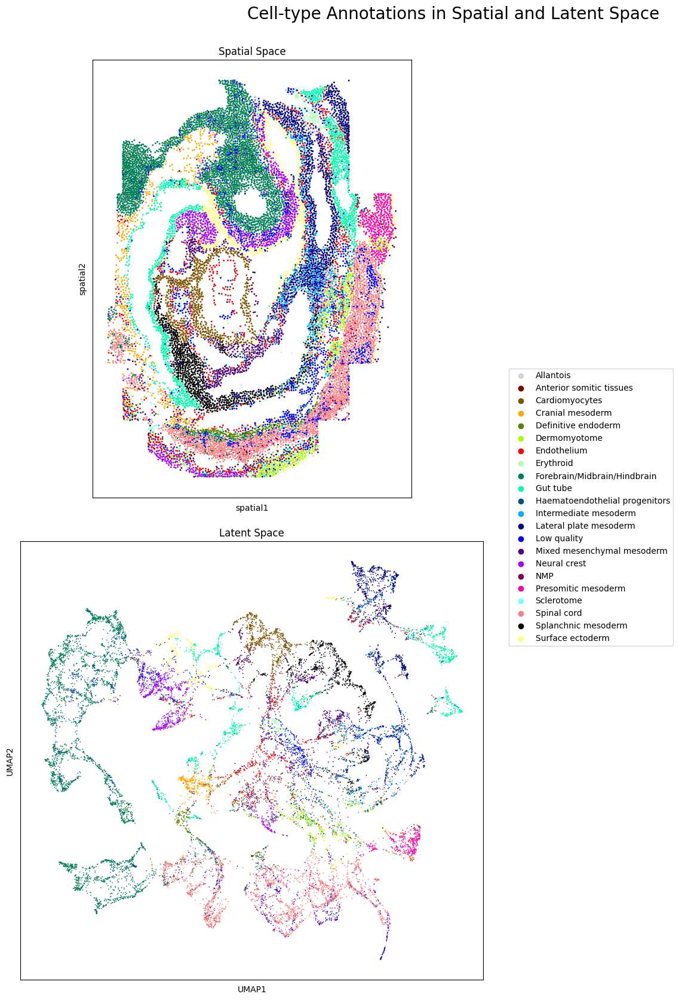

In [24]:
# Create subplot of cell-type annotations in physical and latent space
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 20))
title = fig.suptitle(t="Cell-type Annotations in Spatial and Latent Space",
                     x=0.85,
                     y=0.925,
                     fontsize=20)
sc.pl.spatial(adata=model.adata,
              color=[cell_type_key],
              spot_size=0.03,
              title="Spatial Space",
              ax=axs[0],
              show=False)
sc.pl.umap(adata=model.adata,
           color=[cell_type_key],
           title="Latent Space",
           ax=axs[1],
           show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles, labels, bbox_to_anchor=(1.225, 0.625))
axs[0].get_legend().remove()
axs[1].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0, hspace=0.1)
fig.savefig(f"{figure_path}/cell_type_annotations_in_spatial_and_latent_space.png",
            bbox_extra_artists=(lgd, title),
            bbox_inches="tight")
plt.show()

### 4.2 Latent Leiden Cluster Annotations in Latent and Spatial Space

In [25]:
model.compute_latent_graph_connectivities(adata=model.adata,
                                          n_neighbors=int(round(avg_edges_per_node)),
                                          mode="knn",
                                          seed=random_seed)

In [26]:
# Compute latent Leiden clustering
resolution = 0.3

sc.tl.leiden(adata=model.adata,
             resolution=resolution,
             random_state=random_seed,
             key_added=f"latent_leiden_{str(resolution)}",
             adjacency=model.adata.obsp["latent_connectivities"])

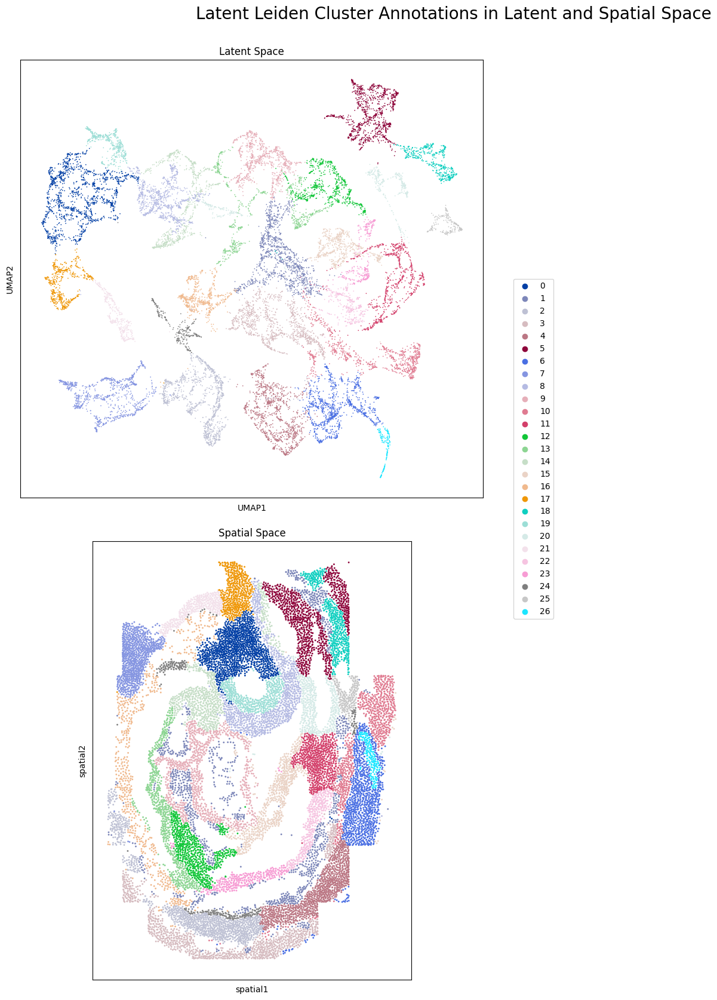

In [27]:
# Create subplot of latent Leiden cluster annotations in physical and latent space
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 20))
title = fig.suptitle(t="Latent Leiden Cluster Annotations in Latent and Spatial Space",
                     x=0.85,
                     y=0.925,
                     fontsize=20)
sc.pl.umap(adata=model.adata,
           color=[f"latent_leiden_{str(resolution)}"],
           title=f"Latent Space",
           ax=axs[0],
           show=False)
sc.pl.spatial(adata=model.adata,
              color=[f"latent_leiden_{str(resolution)}"],
              spot_size=0.03,
              title=f"Spatial Space",
              ax=axs[1],
              show=False)

# Create and position shared legend
handles, labels = axs[0].get_legend_handles_labels()
lgd = fig.legend(handles, labels, bbox_to_anchor=(1.025, 0.7))
axs[0].get_legend().remove()
axs[1].get_legend().remove()

# Adjust, save and display plot
plt.subplots_adjust(wspace=0, hspace=0.1)
fig.savefig(f"{figure_path}/latent_leiden_cluster_annotations_in_latent_and_spatial_space.png",
            bbox_extra_artists=(lgd, title),
            bbox_inches="tight")
plt.show()

### 4.3 GP Enrichments

#### 4.3.1 Cell-type GP Enrichments

In [28]:
differential_gp_scores_key = "autotalker_cell_type_differential_gp_scores"
n_top_up_gps = 6
n_top_down_gps = 6

##### 4.3.1.1 Explore All GPs Across All Categories

In [29]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=None,
                                                      selected_cats=None,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [30]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Cardiomyocytes,TGFB2_ligand_targetgenes_GP,0.995047,0.004953,5.302839
1,Cardiomyocytes,PTDSS1_ligand_targetgenes_GP,0.987268,0.012732,4.350835
2,Presomitic mesoderm,CER1_ligand_receptor_GP,0.986031,0.013969,4.256834
3,Cardiomyocytes,BMP7_ligand_receptor_GP,0.984860,0.015140,4.175151
4,Erythroid,Glycine_metabolite_enzyme_sensor_GP,0.982155,0.017845,4.008020
5,Erythroid,CRLF1_ligand_targetgenes_GP,0.979969,0.020031,3.890217


In [31]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
10977,Cardiomyocytes,IGF1_ligand_targetgenes_GP,0.003951,0.996049,-5.529839
10976,Cardiomyocytes,WNT5B_ligand_receptor_GP,0.004924,0.995076,-5.308703
10975,Cardiomyocytes,EBI3_ligand_targetgenes_GP,0.006383,0.993617,-5.047769
10974,Cardiomyocytes,CDH11_ligand_targetgenes_GP,0.007112,0.992888,-4.938898
10973,Cardiomyocytes,VGF_ligand_targetgenes_GP,0.016101,0.983899,-4.112671
10972,Presomitic mesoderm,SECTM1_ligand_targetgenes_GP,0.025861,0.974139,-3.628830


         Falling back to preprocessing with `sc.pp.pca` and default params.


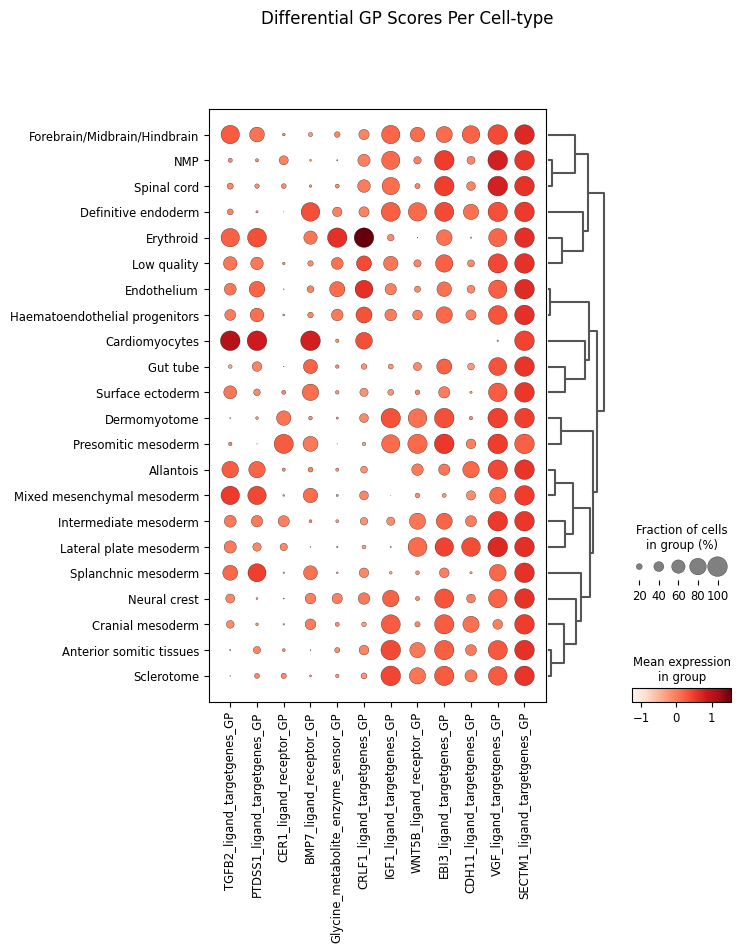

In [32]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/differential_gp_scores_per_cell_type_all_categories.png")
plt.show()

In [33]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

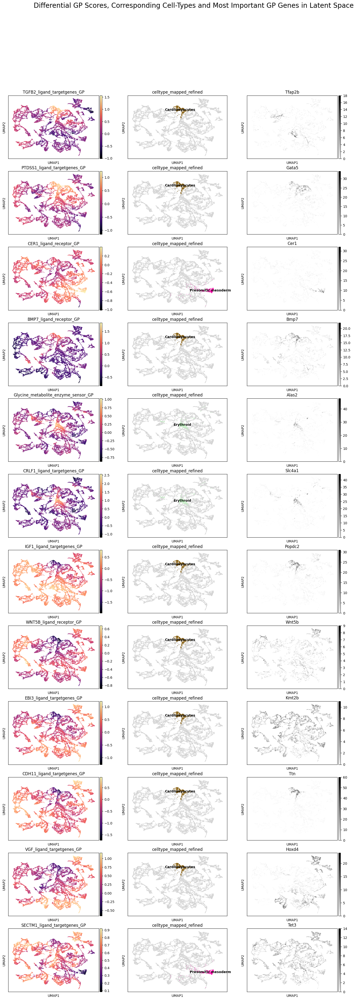

In [34]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/cell_type_gp_scores_cell_types_most_important_genes_all_categories.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

##### 4.3.1.2 Explore All GPs Across Specific Categories

In [35]:
selected_cats = ["Erythroid", "Cardiomyocytes"]

In [36]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=None,
                                                      selected_cats=selected_cats,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [37]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Cardiomyocytes,TGFB2_ligand_targetgenes_GP,0.995538,0.004462,5.407645
1,Cardiomyocytes,PTDSS1_ligand_targetgenes_GP,0.985666,0.014334,4.230690
2,Cardiomyocytes,BMP7_ligand_receptor_GP,0.983762,0.016238,4.104043
3,Erythroid,Glycine_metabolite_enzyme_sensor_GP,0.981413,0.018587,3.966512
4,Erythroid,CRLF1_ligand_targetgenes_GP,0.976051,0.023949,3.707587
5,Erythroid,EPOR_ligand_receptor_GP,0.974312,0.025688,3.635722


In [38]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
997,Cardiomyocytes,EBI3_ligand_targetgenes_GP,0.005773,0.994227,-5.148761
996,Cardiomyocytes,CDH11_ligand_targetgenes_GP,0.005956,0.994044,-5.117321
995,Cardiomyocytes,WNT5B_ligand_receptor_GP,0.006985,0.993015,-4.956938
994,Cardiomyocytes,IGF1_ligand_targetgenes_GP,0.007780,0.992220,-4.848343
993,Cardiomyocytes,VGF_ligand_targetgenes_GP,0.009000,0.991000,-4.701463
992,Cardiomyocytes,NPNT_ligand_targetgenes_GP,0.036718,0.963282,-3.267085


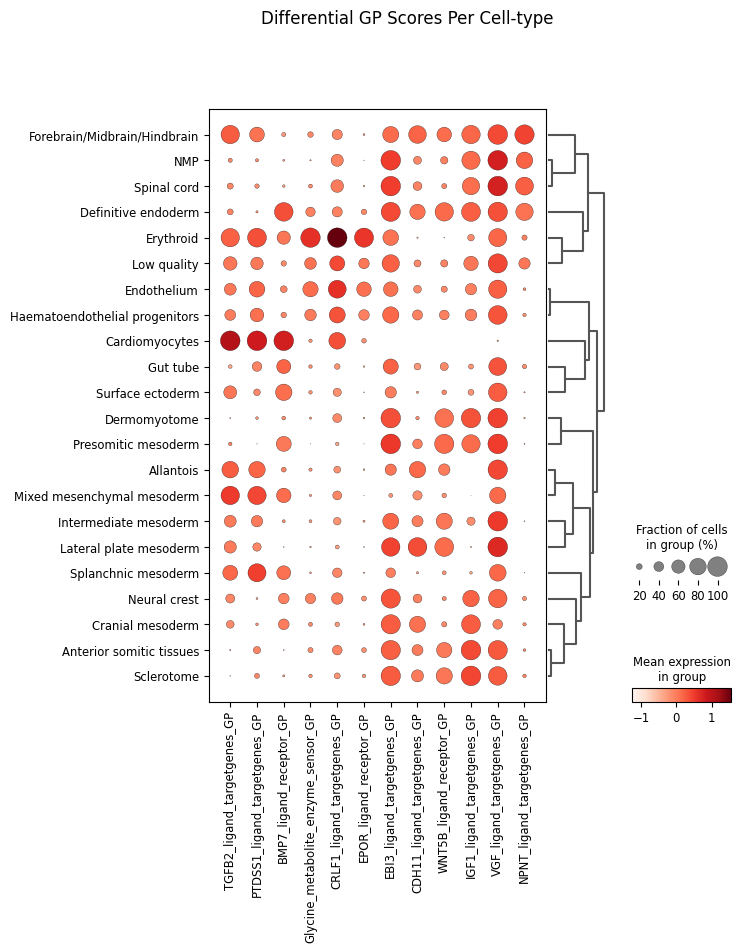

In [39]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/differential_gp_scores_per_cell_type_specific_categories.png")
plt.show()

In [40]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

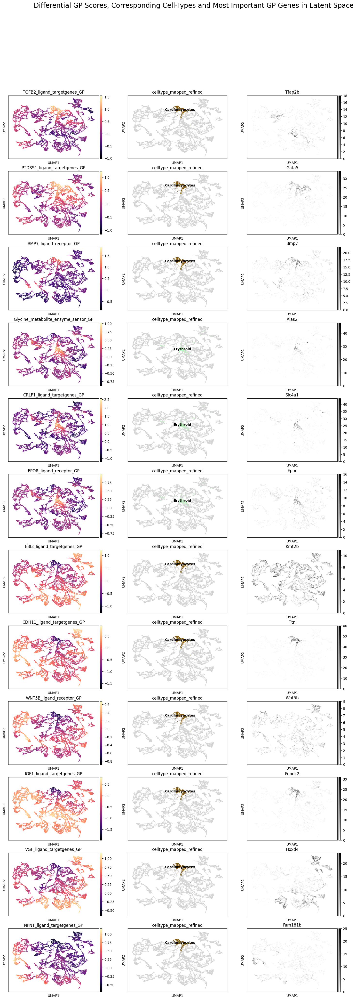

In [41]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/cell_type_gp_scores_cell_types_most_important_genes_specific_categories.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

##### 4.3.1.3 Explore Specific GPs

In [42]:
selected_gps = ["BMP7_ligand_targetgenes_GP", "EPOR_ligand_receptor_GP"]

In [43]:
# Compute gene program enrichments and retrieve top up- and downregulated gene programs
top_unique_gps = model.compute_differential_gp_scores(cat_key=cell_type_key,
                                                      adata=model.adata,
                                                      selected_gps=selected_gps,
                                                      selected_cats=None,
                                                      gp_scores_weight_normalization=False,
                                                      comparison_cats="rest",
                                                      n_sample=1000,
                                                      key_added=differential_gp_scores_key,
                                                      n_top_up_gps_retrieved=n_top_up_gps,
                                                      n_top_down_gps_retrieved=n_top_down_gps,
                                                      seed=random_seed)

In [44]:
# Display top upregulated gene programs
top_up_gp_df = model.adata.uns[differential_gp_scores_key][:n_top_up_gps]
display(top_up_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
0,Lateral plate mesoderm,BMP7_ligand_targetgenes_GP,0.722902,0.277098,0.958903
1,Allantois,BMP7_ligand_targetgenes_GP,0.717644,0.282356,0.932805
2,Splanchnic mesoderm,BMP7_ligand_targetgenes_GP,0.700646,0.299354,0.850374
3,Sclerotome,BMP7_ligand_targetgenes_GP,0.698896,0.301104,0.842044
4,Anterior somitic tissues,BMP7_ligand_targetgenes_GP,0.652515,0.347485,0.630113
5,Mixed mesenchymal mesoderm,BMP7_ligand_targetgenes_GP,0.646183,0.353817,0.602304


In [45]:
# Display top downregulated gene programs
top_down_gp_df = model.adata.uns[differential_gp_scores_key][-n_top_down_gps:][::-1]
display(top_down_gp_df)

,category,gene_program,p_h0,p_h1,log_bayes_factor
43,Cardiomyocytes,BMP7_ligand_targetgenes_GP,0.097501,0.902499,-2.225305
42,Presomitic mesoderm,BMP7_ligand_targetgenes_GP,0.199858,0.800142,-1.387181
41,Erythroid,BMP7_ligand_targetgenes_GP,0.294649,0.705351,-0.872909
40,Cardiomyocytes,EPOR_ligand_receptor_GP,0.391507,0.608492,-0.440980
39,NMP,BMP7_ligand_targetgenes_GP,0.400633,0.599367,-0.402828
38,Definitive endoderm,BMP7_ligand_targetgenes_GP,0.404218,0.595782,-0.387920


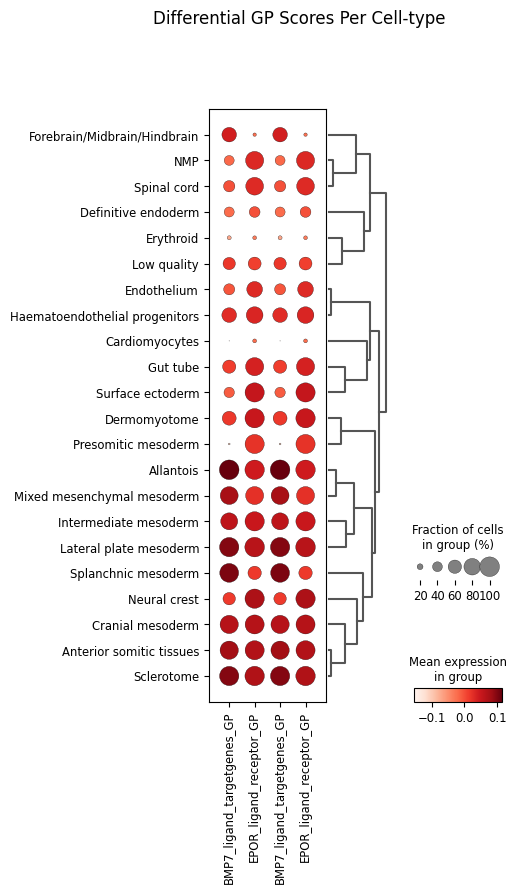

In [46]:
fig = sc.pl.dotplot(model.adata,
                    top_unique_gps,
                    groupby=cell_type_key,
                    dendrogram=True, 
                    title="Differential GP Scores Per Cell-type",
                    return_fig=True)

# Save and display plot
fig.savefig(f"{figure_path}/differential_gp_scores_per_cell_type_specific_gps.png")
plt.show()

In [47]:
top_cats = top_up_gp_df["category"].append(top_down_gp_df["category"]).to_list()
top_gps = top_up_gp_df["gene_program"].append(top_down_gp_df["gene_program"]).to_list()
top_genes = []

for gp in top_gps:
    top_genes.append(
        model.compute_gp_gene_importances(selected_gp=gp)["gene"][0])

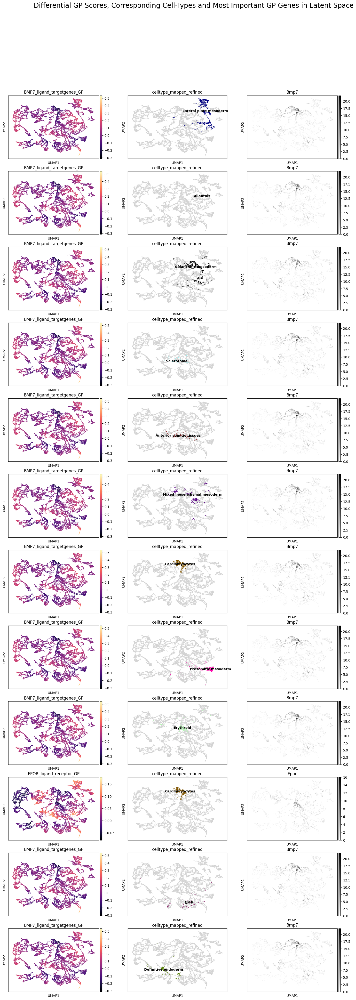

In [48]:
# Plot selected gene program latent scores
fig, axs = plt.subplots(nrows=n_top_up_gps+n_top_down_gps, ncols=3, figsize=(18, 4*len(top_gps)))
title = fig.suptitle(t="Differential GP Scores, Corresponding Cell-Types and Most Important GP Genes in Latent Space",
                     x=0.55,
                     y=0.96,
                     fontsize=20)
for i in range(len(top_gps)):
    sc.pl.umap(model.adata, color=top_gps[i], color_map="magma", ax=axs[i, 0], show=False)
    sc.pl.umap(model.adata,
               color=[cell_type_key],
               color_map="magma",
               groups=top_cats[i],
               ax=axs[i, 1],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    sc.pl.umap(model.adata,
               color=top_genes[i],
               color_map="binary",
               ax=axs[i, 2],
               legend_loc="on data",
               na_in_legend=False,
               show=False)
    
# Save and display plot
fig.savefig(f"{figure_path}/cell_type_gp_scores_cell_types_most_important_genes_specific_gps.png",
            bbox_extra_artists=(title,),
            bbox_inches="tight")
plt.show()

#### 4.3.2 Spatial GP Enrichments

Same analysis can be done with spatial cluster labels instead of cell-types.

#### 4.3.3 GP Gene Importances

In [49]:
selected_gp = ["BMP7_ligand_targetgenes_GP"]

In [50]:
gene_importances_df = model.compute_gp_gene_importances(
    selected_gp="BMP7_ligand_receptor_GP",
    adata=None)

display(gene_importances_df)

,gene,gene_entity,gene_weight_sign_corrected,gene_importance
0,Bmp7,source,1.562632,0.920871
1,Acvr1,target,0.134275,0.079129


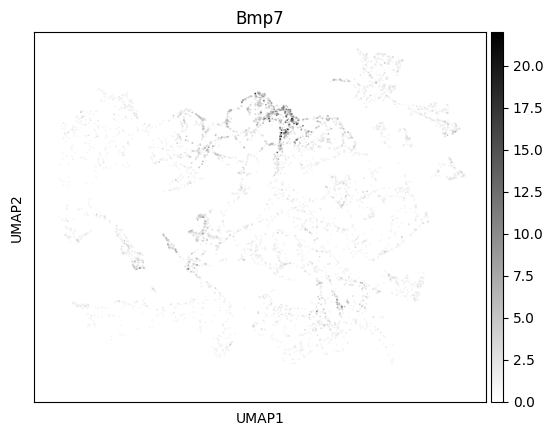

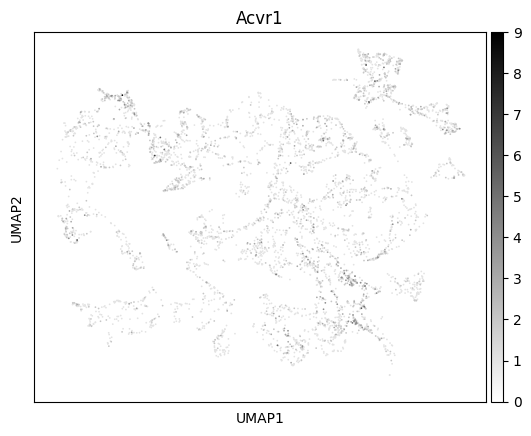

In [51]:
genes = list(gene_importances_df["gene"])

for gene in genes:
    sc.pl.umap(model.adata,
               color=gene,
               color_map="binary",
               legend_loc="on data",
               na_in_legend=False)

## 5. Learn De-Novo CCI GPs

### 5.1 Initialize, Train & Save Model

In [52]:
model = Autotalker.load(dir_path=f"{model_artifacts_path}/autotalker_combined_gps_{current_timestamp}",
                        adata=None,
                        adata_file_name=f"{dataset}.h5ad",
                        n_addon_gps=10,
                        gp_names_key=gp_names_key,
                        freeze_non_addon_weights=True)

--- INITIALIZING NEW NETWORK MODULE: VARIATIONAL GENE PROGRAM GRAPH AUTOENCODER ---
LOSS -> include_edge_recon_loss: True, include_gene_expr_recon_loss: True, gene_expr_recon_dist: nb
NODE LABEL METHOD -> one-hop-attention
ACTIVE GP THRESHOLD RATIO -> 0
GRAPH ENCODER -> n_input: 351, n_hidden: 499, n_latent: 499, n_addon_latent: 10, conv_layer: gcnconv, n_attention_heads:  - dropout_rate: 0.0
DOT PRODUCT GRAPH DECODER -> dropout_rate: 0.0
MASKED GENE EXPRESSION DECODER -> n_input: 499, n_addon_input: 10, n_output: 702


In [53]:
model.train(n_epochs=n_epochs,
            n_epochs_all_gps=n_epochs_all_gps,
            lr=lr,
            lambda_l1_addon=lambda_l1_addon)

--- INITIALIZING TRAINER ---
Number of training nodes: 15532
Number of validation nodes: 1942
Number of test nodes: 1942
Number of training edges: 69902
Number of validation edges: 3883
Number of test edges: 3883

--- MODEL TRAINING ---
Epoch 1/10 |██------------------| 10.0% train_global_loss: 472.6424; train_optim_loss: 472.6424; val_global_loss: 473.9411; val_optim_loss: 473.9411
Epoch 2/10 |████----------------| 20.0% train_global_loss: 470.8417; train_optim_loss: 470.8417; val_global_loss: 474.2925; val_optim_loss: 474.2925



KeyboardInterrupt



In [ ]:
model.save(dir_path=f"{model_artifacts_path}/autotalker_combined_denovo_gps_{current_timestamp}",
           overwrite=True,
           save_adata=True,
           adata_file_name=f"{dataset}.h5ad")

Same analysis can be repeated with de-novo gene programs.